In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import umap
import plotly.express as px
import plotly.graph_objects as go

import umap
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from os.path import join as oj
from sklearn.mixture import BayesianGaussianMixture
from sklearn.ensemble import RandomForestClassifier



In [36]:
animal = 'RRM026'
session = 'Day176'
root_folder = r'/Users/yang/Documents/Wilbrecht_Lab/data4analysis/preprocessed_data'

'''
# following code block is used to extract assigned animal and session
animal_folder = oj(root_folder, animal)

dataframes = []

# Check if the animal folder exists
if os.path.isdir(animal_folder):
    session_folder = oj(animal_folder, session)
    if os.path.isdir(session_folder):
        for filename in os.listdir(session_folder):
            if filename.startswith(f'{animal}_{session}') and filename.endswith('_processed.csv'):
                file_path = oj(session_folder, filename)
                df = pd.read_csv(file_path, index_col=False)
                dataframes.append(df)
    else:
        print('No matching session folder found.')
else:
    print('No matching animal folder found.')

if dataframes:
    combined_df = pd.concat(dataframes, ignore_index=True)
else:
    print("No matching files found.")
    '''


'\n# following code block is used to extract assigned animal and session\nanimal_folder = oj(root_folder, animal)\n\ndataframes = []\n\n# Check if the animal folder exists\nif os.path.isdir(animal_folder):\n    session_folder = oj(animal_folder, session)\n    if os.path.isdir(session_folder):\n        for filename in os.listdir(session_folder):\n            if filename.startswith(f\'{animal}_{session}\') and filename.endswith(\'_processed.csv\'):\n                file_path = oj(session_folder, filename)\n                df = pd.read_csv(file_path, index_col=False)\n                dataframes.append(df)\n    else:\n        print(\'No matching session folder found.\')\nelse:\n    print(\'No matching animal folder found.\')\n\nif dataframes:\n    combined_df = pd.concat(dataframes, ignore_index=True)\nelse:\n    print("No matching files found.")\n    '

In [37]:
combined_df = pd.read_csv(oj(root_folder, 'combined_df.csv'), index_col=False)

In [38]:
print(combined_df.shape)
combined_df.head()

(1643207, 39)


,Unnamed: 0,Head x,Head y,Neck x,Neck y,Torso x,Torso y,Tailhead x,Tailhead y,warped Head x,...,Head velocity,Neck velocity,Torso velocity,Tailhead velocity,Head acceleration,Neck acceleration,Torso acceleration,Tailhead acceleration,animal,session
0,0,192.796951,28.332069,195.778046,23.389879,199.605362,11.785733,203.450699,6.817648,273.703649,...,0.000000,0.000000,0.000000,0.000000,6649.885821,4646.693069,4412.589343,590.246091,RRM028,Day141
1,1,192.110931,35.688915,195.196640,28.520031,199.130478,16.665558,203.038986,7.328142,274.235963,...,221.662861,154.889769,147.086311,19.674870,312.597565,2818.161807,3099.677421,4895.582548,RRM028,Day141
2,2,191.869446,43.421238,192.651031,36.414017,196.267807,24.506279,199.963287,12.590609,274.606919,...,232.082780,248.828496,250.408892,182.860955,-2067.092682,-755.839578,-671.529336,1497.167579,RRM028,Day141
3,3,191.725861,48.858665,192.430756,43.865223,195.759293,32.090069,199.434418,20.331448,275.048460,...,163.179690,223.633843,228.024581,232.766541,2402.980104,552.449666,-58.973204,-460.739103,RRM028,Day141
4,4,191.152802,56.947693,191.896271,51.915794,195.551804,39.622505,199.436478,27.578400,276.035795,...,243.279027,242.048832,226.058807,217.408570,-1.766716,-338.857171,218.826253,883.502202,RRM028,Day141


REJ
min         26.000000
1%          29.000000
2%          30.000000
5%          32.000000
10%         34.000000
50%         46.000000
max      12234.000000

ACC
min        13.000000
1%         39.000000
2%         41.000000
5%         42.000000
10%        44.000000
50%        50.000000
max       534.000000

quit
min        36.000000
1%         44.000000
2%         47.000000
5%         54.000000
10%        60.000000
50%       139.000000
max      8571.000000

In [39]:
current_trial_num = 1
current_decision = np.nan
current_restaurant = np.nan
decision = np.nan
current_length = 0
sum_of_speed = 0
speed_count = 0
coord_length = 32 # extract first # frames of coords of each trial

#bonsai_decision_list = []
decision_list = []
straight_walking_speed_list =[]
animal_list = []
session_list = []
trial_list = []
trial_lengths = []
current_trial_coords = []
trial_13_coords = []


for index, row in combined_df.iterrows():
    decision = row['decision']
    trial_num = row['trial']
    animal = row['animal']
    session = row['session']
    speed = row['Head velocity']
    restaurant = row['restaurant']
    head_x = row['warped Head x']
    head_y = row['warped Head y']

    if trial_num != current_trial_num: # Start of a new trial
        
        if speed_count != 0:
            average_speed = sum_of_speed/speed_count
        else:
            average_speed = np.nan
            
        if len(current_trial_coords) >= coord_length * 2:
            trial_13_coords.append(current_trial_coords[:(coord_length * 2)])
            decision_list.append(current_decision)
            straight_walking_speed_list.append(average_speed)
            animal_list.append(animal)
            session_list.append(session)
            trial_list.append(current_trial_num)
            trial_lengths.append(current_length)

        current_restaurant = restaurant
        current_decision = np.nan
        current_trial_num = trial_num 
        sum_of_speed = 0
        speed_count = 0
        current_length = 1
        current_trial_coords = [head_x, head_y]

    else: # Within trial
        current_length += 1
        current_trial_coords.append(head_x)
        current_trial_coords.append(head_y)
        
    if not pd.isna(decision): # Decision != None
        current_decision = decision
    
    if pd.isna(current_decision) and (speed < 300): # Straight walking speed
        sum_of_speed += speed
        speed_count += 1

coord_columns = [f'x{i//2+1}' if i % 2 == 0 else f'y{i//2+1}' for i in range(coord_length * 2)]
coords_df = pd.DataFrame(trial_13_coords, columns=coord_columns)

other_df = pd.DataFrame({
    #'bonsai decision': bonsai_decision_list,
    'decision': decision_list,
    'straight_walking_speed': straight_walking_speed_list,
    'animal': animal_list,
    'session': session_list,
    'trial': trial_list,
    'trial_length': trial_lengths,
})

result_df = pd.concat([coords_df, other_df], axis=1)

In [40]:
print(result_df[result_df['decision'] == 'quit']['trial_length'].describe([0.01, 0.02, 0.05, 0.1]))

count    2879.000000
mean      299.780479
std       600.659121
min        36.000000
1%         43.000000
2%         46.000000
5%         52.000000
10%        59.000000
50%       141.000000
max      8679.000000
Name: trial_length, dtype: float64


In [41]:
# Define the histogram
fig = px.histogram(result_df, x='trial_length', color='decision',
                   title='Distribution of Trial Lengths by Decision',
                   labels={'trial_length': 'Number of Frames per Trial'},
                   nbins=2000,  # Set number of bins
                   opacity=0.5)  # Set opacity for overlapping

# Customize layout
fig.update_layout(
    xaxis_title='Number of Frames per Trial',
    yaxis_title='Frequency',
    bargap=0.1,
    legend_title='Decision',
    template='plotly_white',
)
fig.update_xaxes(range=[0, 2000])
# Show the figure
fig.show()


In [42]:
decision_palette_dict = {
    "ACC": (0, 1, 0),  # Green with transparency
    "REJ": (1, 0, 0),  # Red with transparency
    "quit": (0, 0, 1),  # Blue with transparency
    "T-Entry": (1, 1, 1), # black
    np.nan: (1, 1, 1) # black
}
fig = go.Figure()
for index, row in result_df[:5000].iterrows():
    x_coords = [row[f'x{i}'] for i in range(1, coord_length + 1)]
    y_coords = [row[f'y{i}'] for i in range(1, coord_length + 1)]
    # Extract animal, session, and trial information
    decision, animal, session, trial = row['decision'], row['animal'], row['session'], row['trial']
    # Determine the color for the current trial
    color = 'rgba' + str(tuple(int(c * 255) for c in decision_palette_dict[decision]) + (0.2,))
    fig.add_trace(go.Scatter(
        x=x_coords, y=y_coords,
        mode='lines',
        name=f'Trial {row["trial"]}',
        line=dict(color=color, width=0.5),
    ))

fig.update_layout(
    title='Coordinates of Each Trial',
    xaxis_title='X Coordinates',
    yaxis_title='Y Coordinates',
    yaxis=dict(autorange='reversed'),
    showlegend=False,
)

fig.show()

In [43]:
# Define the trajectory columns
umap_columns = [f'x{i}' for i in range(1, coord_length + 1)] + [f'y{i}' for i in range(1, coord_length + 1)]

# Extract the coordinate data
coords_data = result_df[umap_columns]

n_components = 5
n_clusters = 5

# Perform UMAP
reducer = umap.UMAP(n_components=n_components, random_state=42)
umap_components = reducer.fit_transform(coords_data)

# Create a DataFrame for the UMAP components
umap_columns = [f'UMAP{i+1}' for i in range(n_components)]
umap_df = pd.DataFrame(umap_components, columns=umap_columns)

# Add the UMAP components to the original DataFrame
coords_umap = pd.concat([result_df.reset_index(drop=True), umap_df.reset_index(drop=True)], axis=1)

# Scatter plot of UMAP1 and UMAP2 with decisions using Plotly
fig = px.scatter(coords_umap, x='UMAP1', y='UMAP2', color='decision',
                 title='Scatter Plot of UMAP1 and UMAP2 with Decision Distributions',
                 labels={'UMAP1': 'UMAP1', 'UMAP2': 'UMAP2'},
                 hover_data=['decision'])
fig.update_traces(marker=dict(size=2))
fig.show()

/opt/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



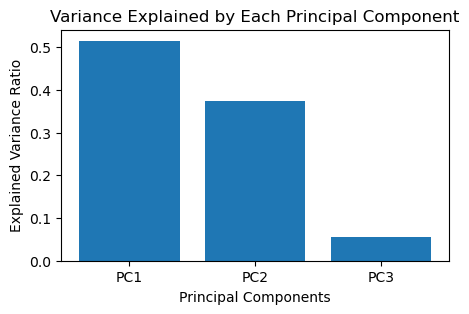

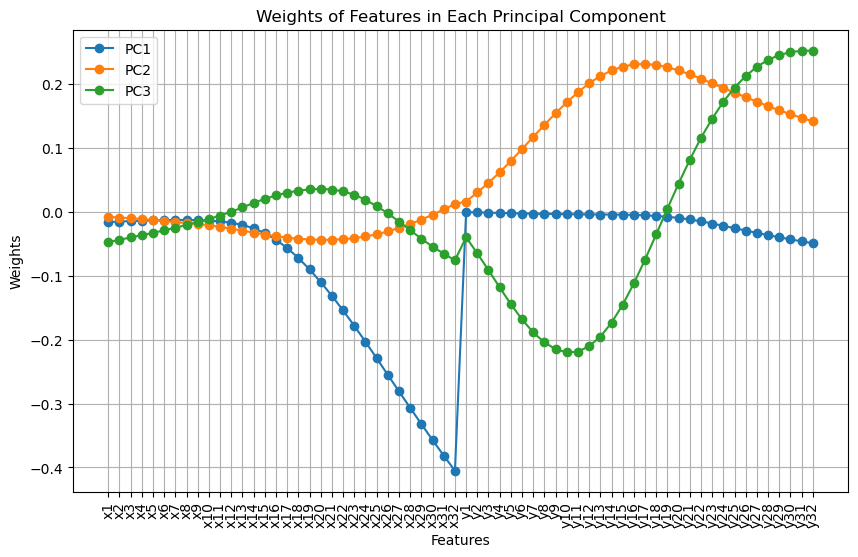

In [44]:
# Define the trajectory columns
pca_columns = [f'x{i}' for i in range(1, coord_length + 1)] + [f'y{i}' for i in range(1, coord_length + 1)]

# Extract the coordinate data
coords_data = result_df[pca_columns]

# Perform PCA
n_components = 3
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(coords_data)

# Create a DataFrame for the principal components
pc_columns = [f'PC{i+1}' for i in range(n_components)]
pc_df = pd.DataFrame(principal_components, columns=pc_columns)

# Add the principal components to the original DataFrame
speed_pca = pd.concat([result_df.reset_index(drop=True), pc_df.reset_index(drop=True)], axis=1)

# Scatter plot of PC1 and PC2 with decisions using Plotly
fig = px.scatter(speed_pca, x='PC1', y='PC2', color='decision',
                 title='Scatter Plot of PC1 and PC2 with Decision Distributions',
                 labels={'PC1': 'PC1', 'PC2': 'PC2'},
                 hover_data=['decision'])
fig.update_traces(marker=dict(size=2))
fig.show()

# Plot the explained variance
explained_variance = pca.explained_variance_ratio_
plt.figure(figsize=(5, 3))
plt.bar(range(1, n_components + 1), explained_variance, tick_label=pc_columns)
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Variance Explained by Each Principal Component')
plt.show()

# Show the formula for each PC
components = pca.components_

# Create formulas for each PC
feature_names = coords_data.columns
pc_formulas = {}
for i in range(n_components):
    formula = " + ".join([f"{components[i, j]:.2f}*{feature_names[j]}" for j in range(len(feature_names))])
    pc_formulas[f'PC{i+1}'] = formula

# Create formulas for each PC
feature_names = coords_data.columns
pc_formulas = {}
for i in range(n_components):
    formula = " + ".join([f"{components[i, j]:.2f}*{feature_names[j]}" for j in range(len(feature_names))])
    pc_formulas[f'PC{i+1}'] = formula

# Create a DataFrame for the weights
weights_df = pd.DataFrame(components.T, index=feature_names, columns=pc_columns)

# Plot the weights for each principal component
plt.figure(figsize=(10, 6))
for pc in pc_columns:
    plt.plot(weights_df.index, weights_df[pc], label=pc, marker='o')

plt.xlabel('Features')
plt.ylabel('Weights')
plt.title('Weights of Features in Each Principal Component')
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)
plt.show()

of both dim deduction:
reject trials are clearly defferentiated from others.
accept and quit trials are partially merged.

implications from PCA results:
PC1 emphasis on x coord after T-Entry, defferentiating between REJ and others.
PC2 emphasis on y coord after T-Entry, partially defferentiating between ACC and quit.
UMAP probably has the similar idea.

generally, UMAP is spliting the decision better than PCA.

Future implication:
use GMM or other non-circular probabilistic clustering model to give a score for each trial, then look at the effect of this score on the classification of neural activity.

In [45]:
coords_umap.head()

,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,...,straight_walking_speed,animal,session,trial,trial_length,UMAP1,UMAP2,UMAP3,UMAP4,UMAP5
0,273.703649,130.625305,274.235963,124.023690,274.606919,117.536312,275.048460,111.118353,276.035795,104.365713,...,188.774688,RRM028,Day141,4.0,59,10.116094,8.807383,3.579002,1.983795,5.588482
1,278.505831,127.307328,278.338044,121.500514,278.484608,115.894415,278.881790,109.548623,279.126810,102.518210,...,190.417145,RRM028,Day141,8.0,33,-0.300250,8.403065,3.696432,2.487587,4.113025
2,275.081359,131.457371,276.551920,125.745898,277.920257,119.725813,279.353280,113.663796,280.992563,107.857920,...,186.188321,RRM028,Day141,12.0,64,8.902527,8.040989,2.186631,2.546747,5.549288
3,277.941905,130.312508,278.577533,123.949534,278.881523,117.752173,279.415347,112.051546,280.815795,106.384137,...,184.343255,RRM028,Day141,16.0,43,2.894319,8.073547,1.852068,1.828481,4.444022
4,274.492893,135.458966,273.985886,135.097281,273.146888,134.716506,271.940633,134.231358,270.906057,133.488431,...,61.098888,RRM028,Day141,20.0,206,7.299313,0.864308,2.531658,3.698140,3.260723


/var/folders/81/kqx_5t9n5vz_mq7d7n66fmdr0000gn/T/ipykernel_59110/2536358948.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



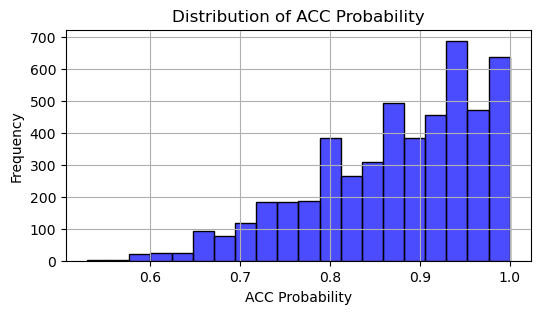

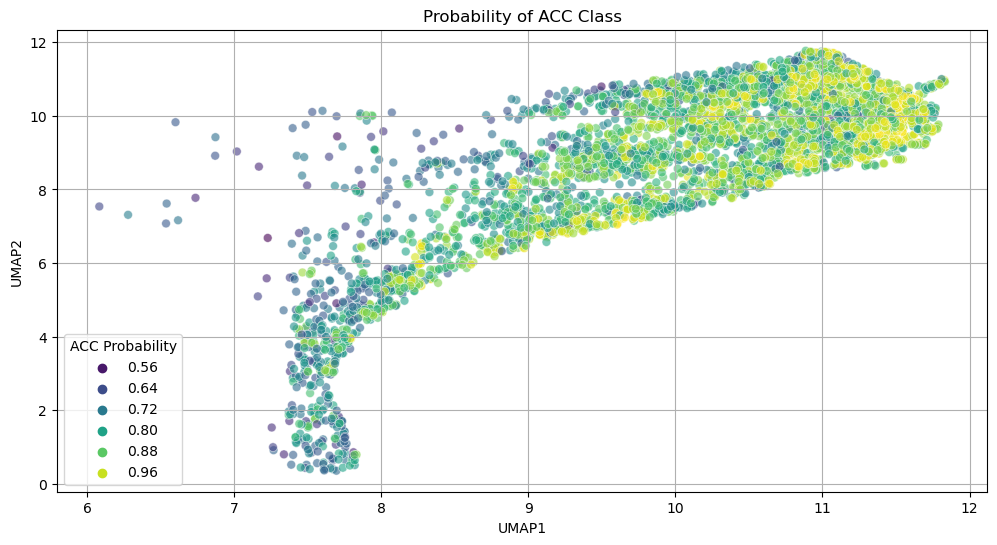

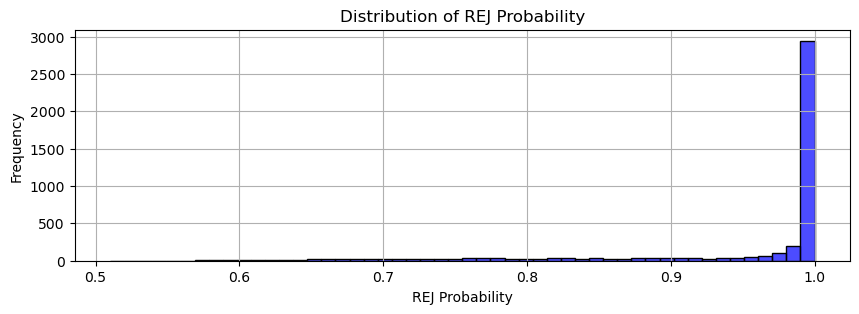

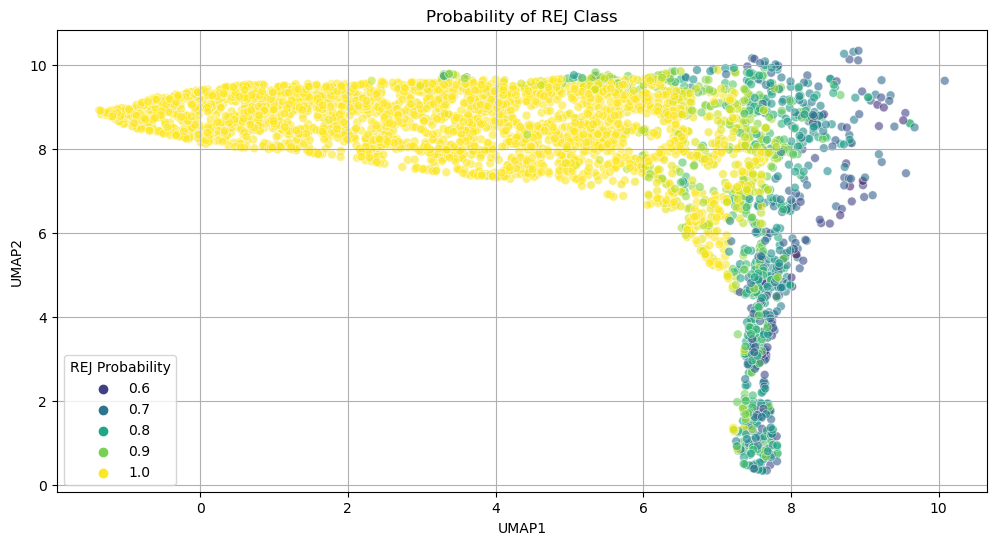

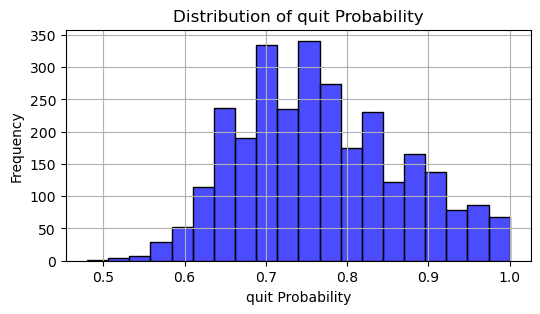

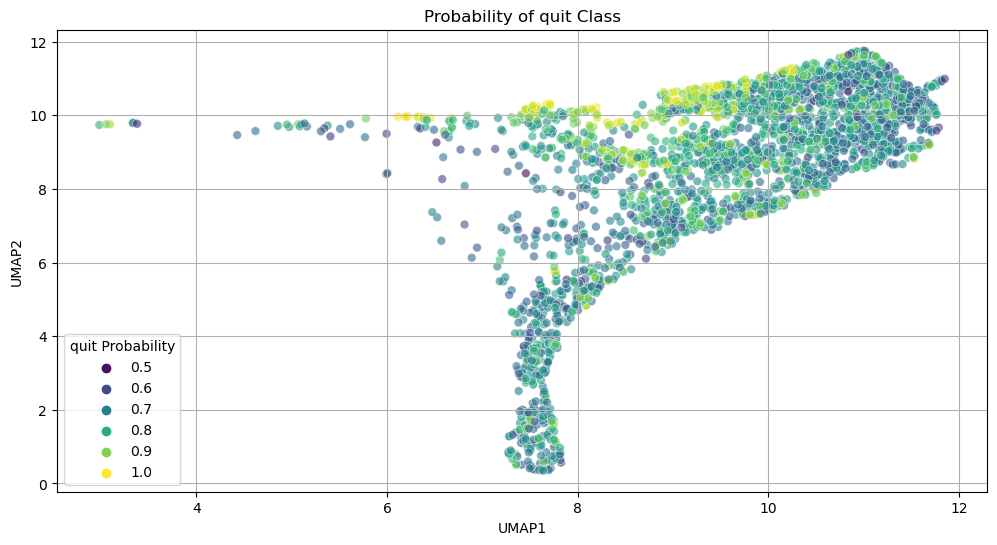

In [46]:
coords_umap_clean = coords_umap.dropna(subset=['UMAP1', 'UMAP2', 'decision'])

desired_decisions = ['ACC', 'REJ', 'quit']
coords_umap_filtered = coords_umap_clean[coords_umap_clean['decision'].isin(desired_decisions)]

X = coords_umap_filtered[['UMAP1', 'UMAP2']]
y = coords_umap_filtered['decision']

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

probs = rf.predict_proba(X)
probs_df = pd.DataFrame(probs, columns=[f'{cls}_prob' for cls in rf.classes_])
coords_umap_filtered = pd.concat([coords_umap_filtered.reset_index(drop=True), probs_df], axis=1)

labels = rf.predict(X)
coords_umap_filtered['Predicted'] = labels

# Prepare for the loop
coords_umap_filtered['cluster'] = None
decision_types = ['ACC', 'REJ', 'quit']
plot_data ={}
group_num = 4

for decision in decision_types:
    decision_filter = coords_umap_filtered['decision'] == decision
    decision_data = coords_umap_filtered[decision_filter]

    prob_col = f'{decision}_prob'
    min_val = decision_data[prob_col].min()
    max_val = decision_data[prob_col].max()
    bins = np.linspace(min_val, max_val, group_num + 1)
    
    decision_data['cluster'] = pd.cut(decision_data[prob_col], bins=bins, labels=False, include_lowest=True)
    
    coords_umap_filtered.loc[decision_filter, 'cluster'] = decision_data['cluster']
    
    plot_data[decision] = coords_umap_filtered[decision_filter]

# ACC plot
plt.figure(figsize=(6, 3))
sns.histplot(plot_data['ACC']['ACC_prob'], bins=20, color='blue', edgecolor='k', alpha=0.7)
plt.title('Distribution of ACC Probability')
plt.xlabel('ACC Probability')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='ACC_prob', data=plot_data['ACC'], palette='viridis', s=40, alpha=0.6, edgecolor='w')
plt.title('Probability of ACC Class')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(title='ACC Probability')
plt.grid(True)
plt.show()

# REJ plot
plt.figure(figsize=(10, 3))
sns.histplot(plot_data['REJ']['REJ_prob'], bins=50, color='blue', edgecolor='k', alpha=0.7)
plt.title('Distribution of REJ Probability')
plt.xlabel('REJ Probability')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='REJ_prob', data=plot_data['REJ'], palette='viridis', s=40, alpha=0.6, edgecolor='w')
plt.title('Probability of REJ Class')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(title='REJ Probability')
plt.grid(True)
plt.show()

# quit plot
plt.figure(figsize=(6, 3))
sns.histplot(plot_data['quit']['quit_prob'], bins=20, color='blue', edgecolor='k', alpha=0.7)
plt.title('Distribution of quit Probability')
plt.xlabel('quit Probability')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='quit_prob', data=plot_data['quit'], palette='viridis', s=40, alpha=0.6, edgecolor='w')
plt.title('Probability of quit Class')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(title='quit Probability')
plt.grid(True)
plt.show()



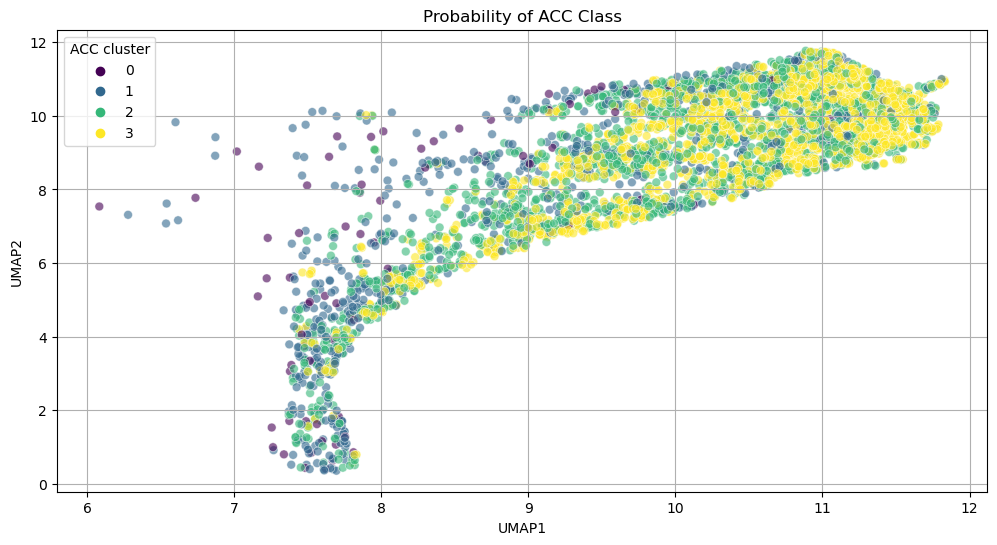

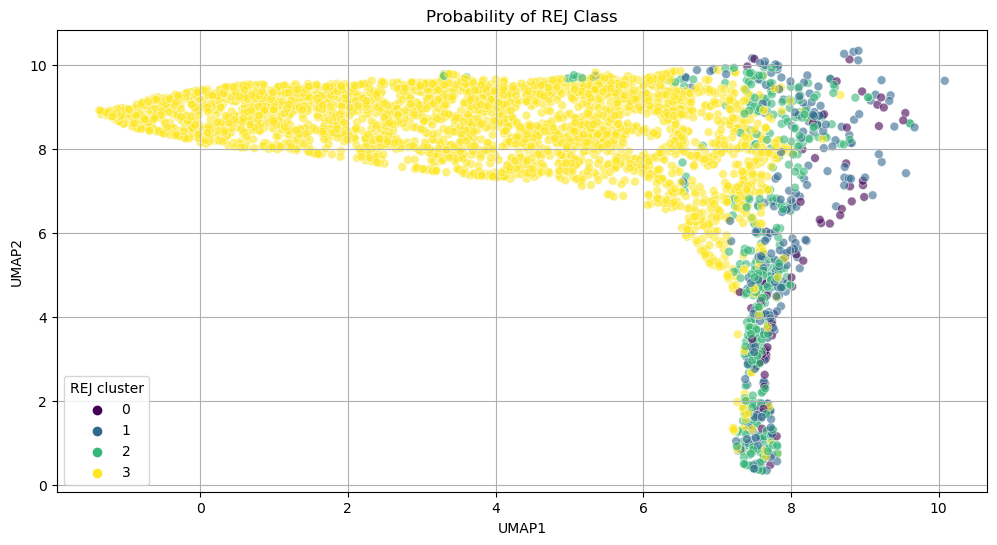

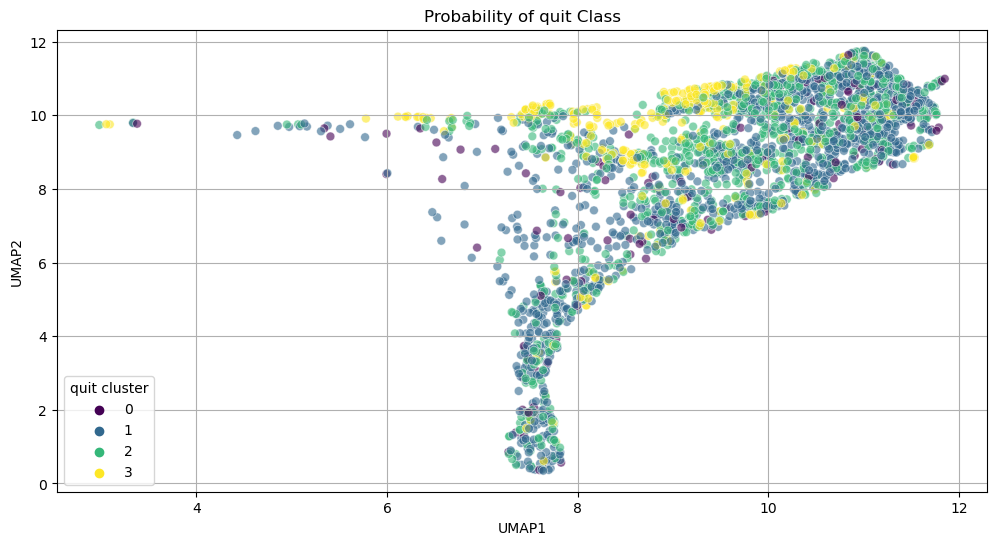

In [47]:
# ACC plot
plt.figure(figsize=(12, 6))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='cluster', data=plot_data['ACC'], palette='viridis', s=40, alpha=0.6, edgecolor='w')
plt.title('Probability of ACC Class')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(title='ACC cluster')
plt.grid(True)
plt.show()

# REJ plot
plt.figure(figsize=(12, 6))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='cluster', data=plot_data['REJ'], palette='viridis', s=40, alpha=0.6, edgecolor='w')
plt.title('Probability of REJ Class')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(title='REJ cluster')
plt.grid(True)
plt.show()

# quit plot
plt.figure(figsize=(12, 6))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='cluster', data=plot_data['quit'], palette='viridis', s=40, alpha=0.6, edgecolor='w')
plt.title('Probability of quit Class')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(title='quit cluster')
plt.grid(True)
plt.show()


In [48]:
coords_umap_filtered.head()

,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,...,UMAP1,UMAP2,UMAP3,UMAP4,UMAP5,ACC_prob,REJ_prob,quit_prob,Predicted,cluster
0,273.703649,130.625305,274.235963,124.023690,274.606919,117.536312,275.048460,111.118353,276.035795,104.365713,...,10.116094,8.807383,3.579002,1.983795,5.588482,0.96,0.00,0.04,ACC,3
1,278.505831,127.307328,278.338044,121.500514,278.484608,115.894415,278.881790,109.548623,279.126810,102.518210,...,-0.300250,8.403065,3.696432,2.487587,4.113025,0.00,1.00,0.00,REJ,3
2,275.081359,131.457371,276.551920,125.745898,277.920257,119.725813,279.353280,113.663796,280.992563,107.857920,...,8.902527,8.040989,2.186631,2.546747,5.549288,0.99,0.00,0.01,ACC,3
3,277.941905,130.312508,278.577533,123.949534,278.881523,117.752173,279.415347,112.051546,280.815795,106.384137,...,2.894319,8.073547,1.852068,1.828481,4.444022,0.00,1.00,0.00,REJ,3
4,274.492893,135.458966,273.985886,135.097281,273.146888,134.716506,271.940633,134.231358,270.906057,133.488431,...,7.299313,0.864308,2.531658,3.698140,3.260723,0.00,0.76,0.24,REJ,2


In [49]:
coords_umap_filtered['trial'].isnull().any()

False